# Extracting Text from Images in Python

In [ ]:
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/DC_II/5. TextOCR')

Mounted at /content/drive


In [ ]:
annot = pd.read_parquet('annot.parquet')
imgs = pd.read_parquet('img.parquet')
img_fns = glob('train_val_images/train_images/*')

In [ ]:
print(len(img_fns))

20497


# Plot Example Images

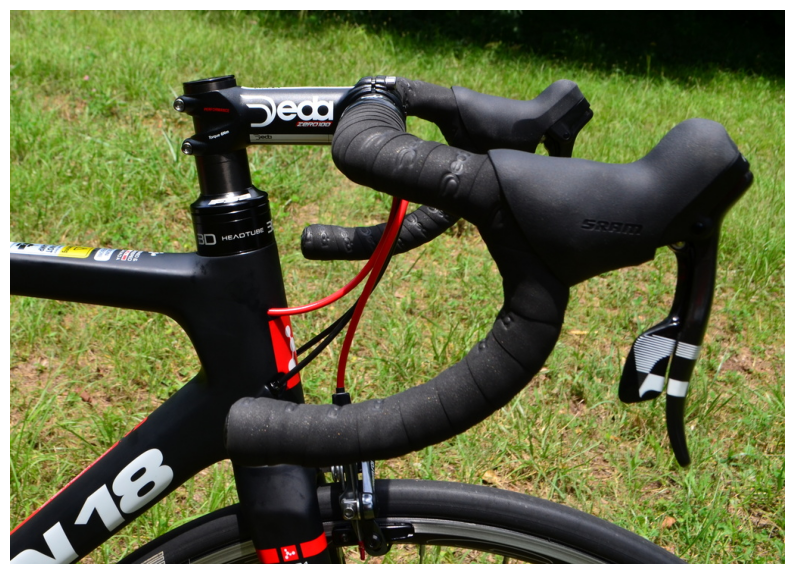

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(plt.imread(img_fns[0]))
ax.axis('off')
plt.show()

In [ ]:
image_id = img_fns[0].split('/')[-1].split('.')[0]
annot.query('image_id == @image_id')

,id,image_id,bbox,utf8_string,points,area


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


## Display for first 25 images

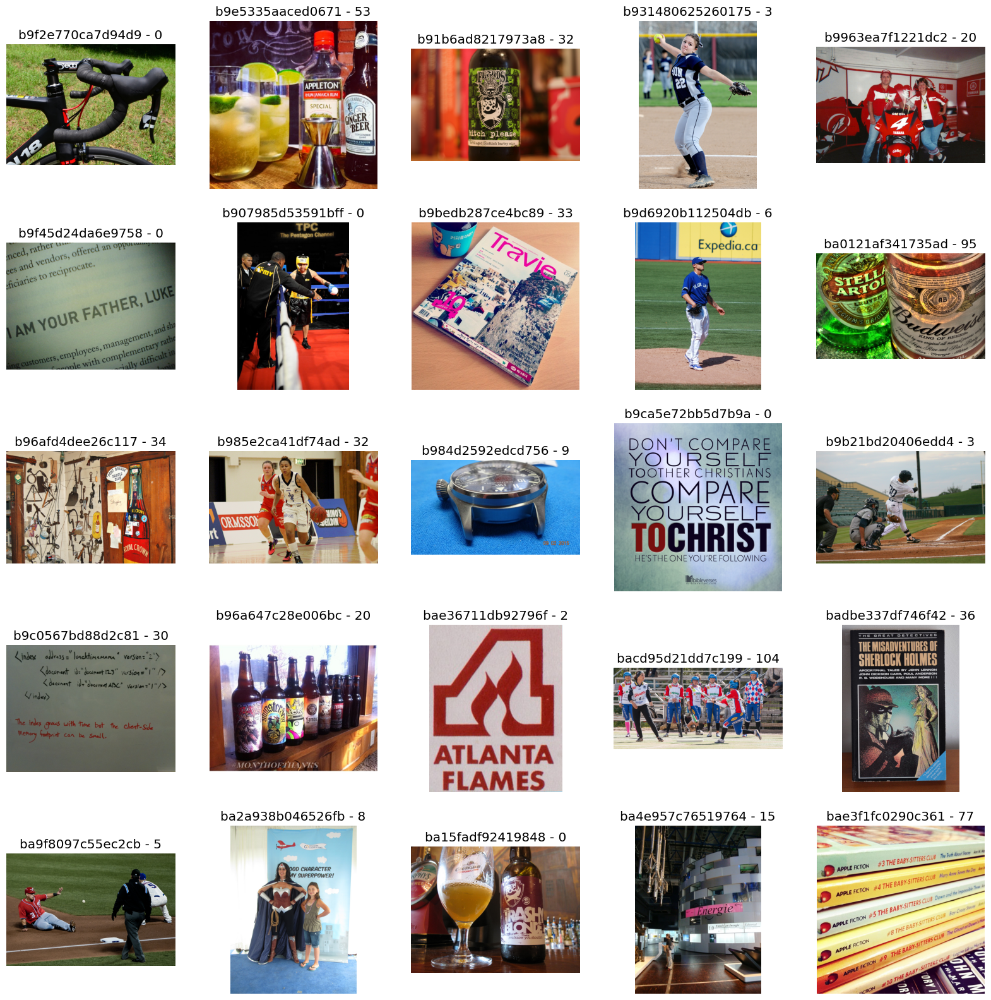

In [ ]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
axs = axs.flatten()
for i in range(25):
    axs[i].imshow(plt.imread(img_fns[i]))
    axs[i].axis('off')
    image_id = img_fns[i].split('/')[-1].rstrip('.jpg')
    n_annot = len(annot.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id} - {n_annot}')
plt.show()

# Method 1: easyocr

In [ ]:
!pip install easyocr


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 67.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 35.4 MB/s eta 0:00:00


In [ ]:
import easyocr

reader = easyocr.Reader(['en'], gpu = True)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
results = reader.readtext(img_fns[11])

In [ ]:
pd.DataFrame(results, columns=['bbox','text','conf'])

,bbox,text,conf
0,"[[468, 238], [496, 238], [496, 246], [468, 246]]",INKO,0.080338
1,"[[527, 315], [559, 315], [559, 329], [527, 329]]",clelaq,0.137799
2,"[[452, 378], [515, 378], [515, 409], [452, 409]]",(BLUE,0.998559
3,"[[701, 347], [813, 347], [813, 411], [701, 411]]",MIOS,0.098104
4,"[[61, 384], [316, 384], [316, 482], [61, 482]]",ORMSSO)',0.616625
5,"[[425, 421], [455, 421], [455, 435], [425, 435]]",BR,0.247080
6,"[[658, 393], [798, 393], [798, 470], [658, 470]]",'JiDit,0.022440
7,"[[0, 462], [66, 462], [66, 546], [0, 546]]",rt,0.947297
8,"[[537.2307692307693, 434.15384615384613], [594...",BILAHOIH,0.109164


# Method 2: keras_ocr

In [ ]:
!pip install keras-ocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 526.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 6.3 MB/s eta 0:00:00


In [ ]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5


Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.


Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:
results = pipeline.recognize([img_fns[11]])

1/1 [==============================] - 4s 4s/step


In [ ]:
pd.DataFrame(results[0], columns=['text', 'bbox'])

,text,bbox
0,lnl,"[[523.0, 54.0], [584.0, 54.0], [584.0, 82.0], ..."
1,isto,"[[467.5718, 238.86462], [496.9116, 237.32043],..."
2,s,"[[505.0, 294.0], [516.0, 294.0], [516.0, 312.0..."
3,telas,"[[528.42755, 316.26898], [556.9172, 314.59314]..."
4,ninos,"[[708.0, 355.0], [805.0, 355.0], [805.0, 404.0..."
5,blue,"[[455.0, 385.0], [513.0, 385.0], [513.0, 408.0..."
6,ormssoi,"[[71.532, 402.3487], [301.63596, 392.87378], [..."
7,qulildin,"[[667.0, 409.0], [787.0, 409.0], [787.0, 460.0..."
8,bes,"[[425.0, 423.0], [453.0, 423.0], [453.0, 434.0..."
9,se,"[[431.0, 436.0], [448.0, 436.0], [448.0, 442.0..."


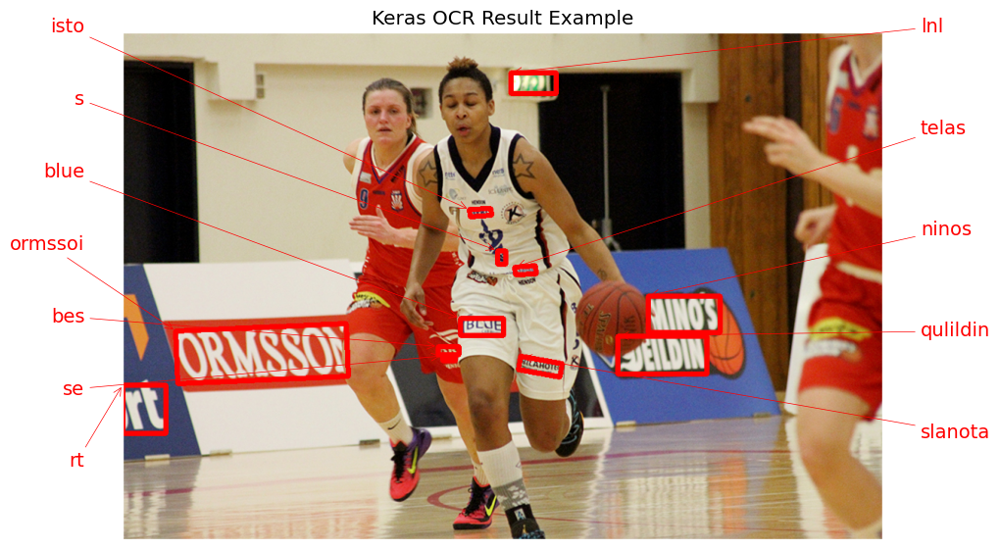

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[11]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

# Compare easyocr vs. keras_ocr

In [ ]:
# easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(img_fns[:25]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/25 [00:00<?, ?it/s]

In [ ]:
# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(img_fns[:25]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 1s 821ms/step


2/2 [==============================] - 2s 2s/step


# Plot Results: easyocr vs keras_ocr

In [ ]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    fig.subplots_adjust(wspace=1)

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn),
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn),
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

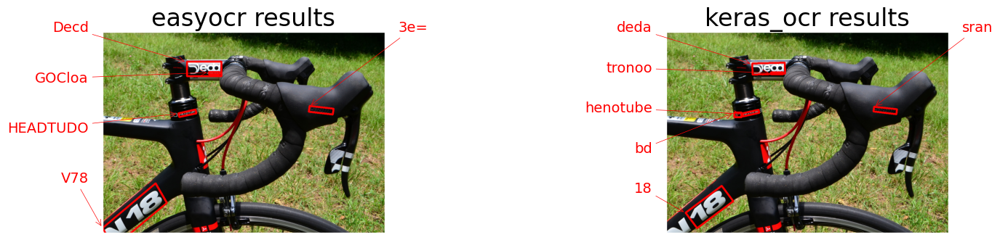

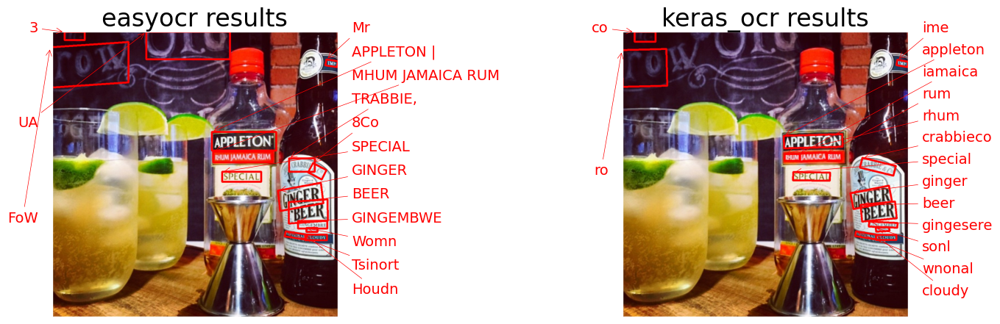

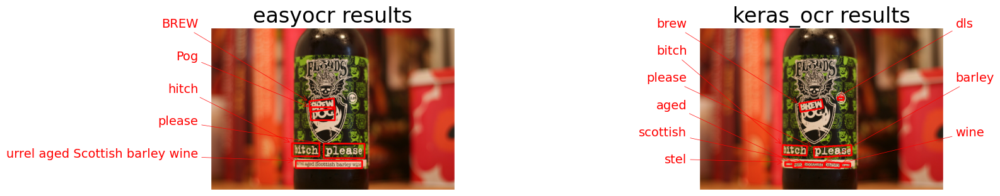

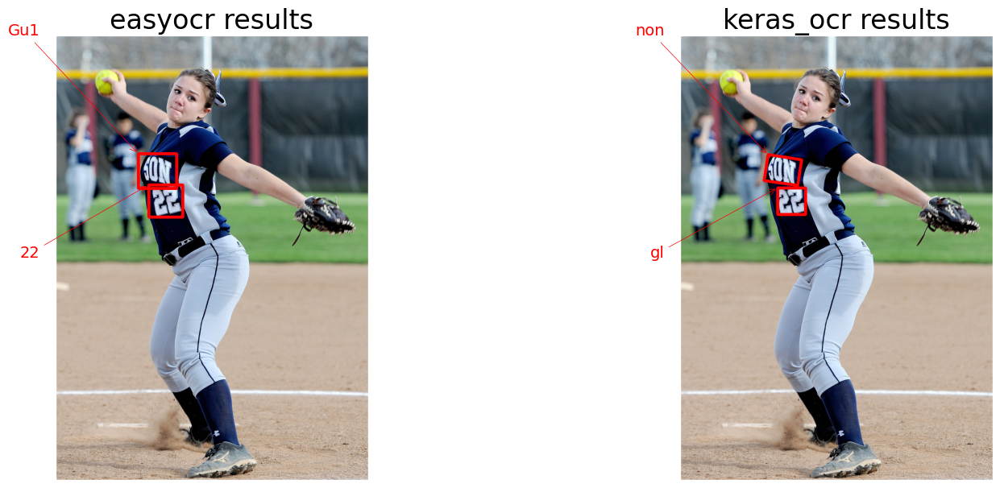

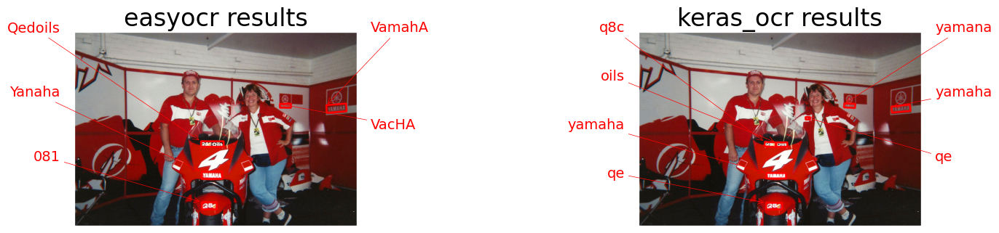

...

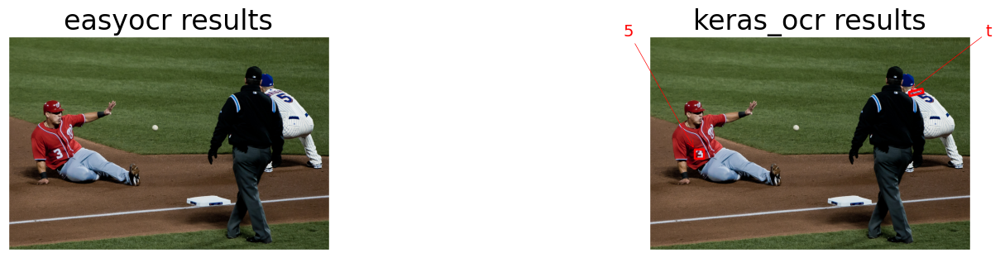

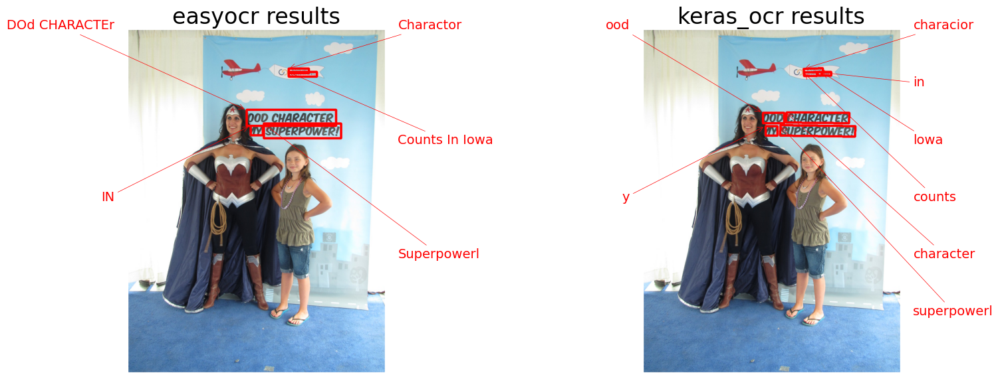

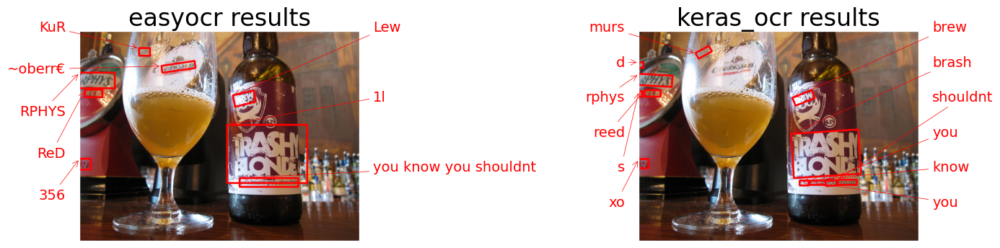

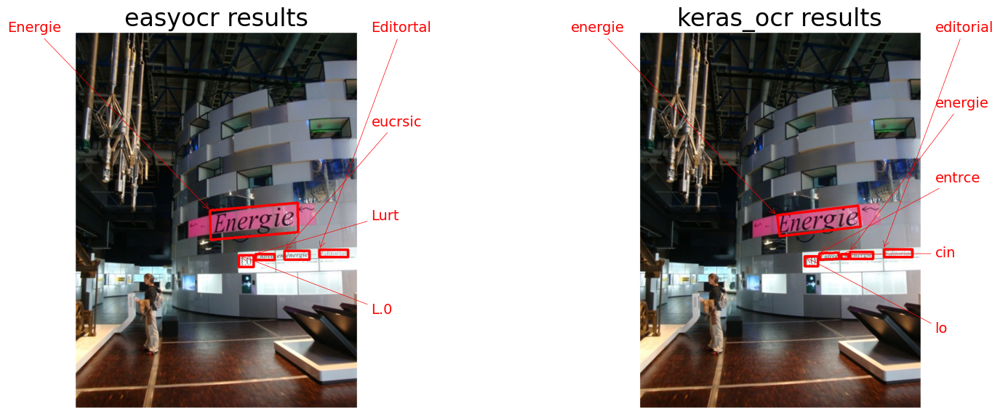

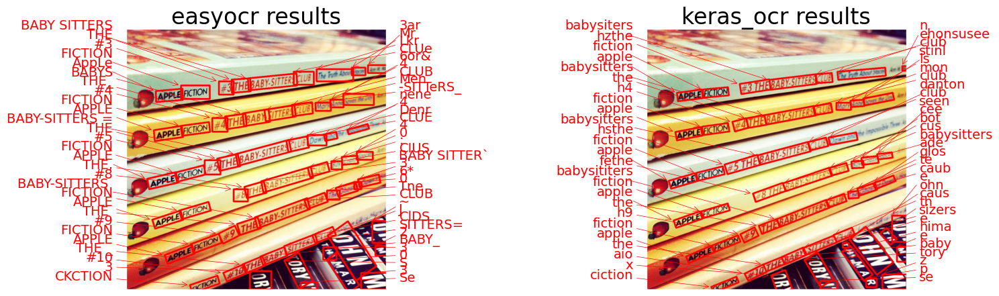

In [ ]:
# Loop over results
for img_fn in img_fns[:25]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)

In [ ]:
ground_truth_df = pd.read_csv('annot.csv')

In [ ]:
print(ground_truth_df.head())

   Unnamed: 0                  id          image_id  \
0           0  a4ea732cd3d5948a_1  a4ea732cd3d5948a   
1           1  a4ea732cd3d5948a_2  a4ea732cd3d5948a   
2           2  a4ea732cd3d5948a_3  a4ea732cd3d5948a   
3           3  a4ea732cd3d5948a_4  a4ea732cd3d5948a   
4           4  a4ea732cd3d5948a_5  a4ea732cd3d5948a   

                            bbox  utf8_string  \
0   [525.83, 3.4, 197.64, 33.94]  Performance   
1  [534.67, 64.68, 91.22, 38.19]        Sport   
2  [626.95, 63.62, 96.52, 31.82]        Watch   
3  [577.4, 141.87, 147.13, 43.1]   ...period.   
4  [391.03, 163.9, 60.82, 38.65]            .   

                                              points     area  
0  [525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...  6707.90  
1  [535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...  3483.69  
2  [626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...  3071.27  
3  [580.02, 143.61, 724.53, 141.87, 723.66, 184.9...  6341.30  
4  [395.2, 163.9, 451.85, 191.94, 445.59, 202.55,...  

In [ ]:
import os

# Update the path to your images folder
images_folder = 'train_val_images/train_images'

# Image filename to search for
image_filename = 'a4ea732cd3d5948a.jpg'

# Full path to the image
image_path = os.path.join(images_folder, image_filename)

# Check if the file exists
if os.path.exists(image_path):
    print(f"The image '{image_filename}' exists in the folder.")
else:
    print(f"The image '{image_filename}' does not exist in the folder.")


The image 'a4ea732cd3d5948a.jpg' exists in the folder.
